<a href="https://colab.research.google.com/github/sushrut88/Dog-Breed-Classification/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install tensorflow==2.15 tensorflow-hub==0.13.0 # We'll use this model as this versions are compatible for our mmodel and latest one are no

In [ ]:
#!unzip "drive/MyDrive/Dog-Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog-Vision/"

## End to end multi-class Dog breed clasification


This notebook builts end to end multi class image classfier using Tensorflow 2.0 and Tensorflow hub.

In [ ]:
import tensorflow as tf
print("Tf version:",tf.__version__)
import tensorflow_hub as hub
print("Hub version:",hub.__version__)
print("GPU","is available " if tf.config.list_physical_devices("GPU") else "not available")

Tf version: 2.15.0
Hub version: 0.13.0
GPU is available 


## Getting our data ready...

Turning images into tensors(mathematical representation).



In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


In [ ]:
labels_csv = pd.read_csv("drive/MyDrive/Dog-Vision/labels.csv")
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,fff43b07992508bc822f33d8ffd902ae,scottish_deerhound
freq,1,126


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


<Axes: xlabel='breed'>

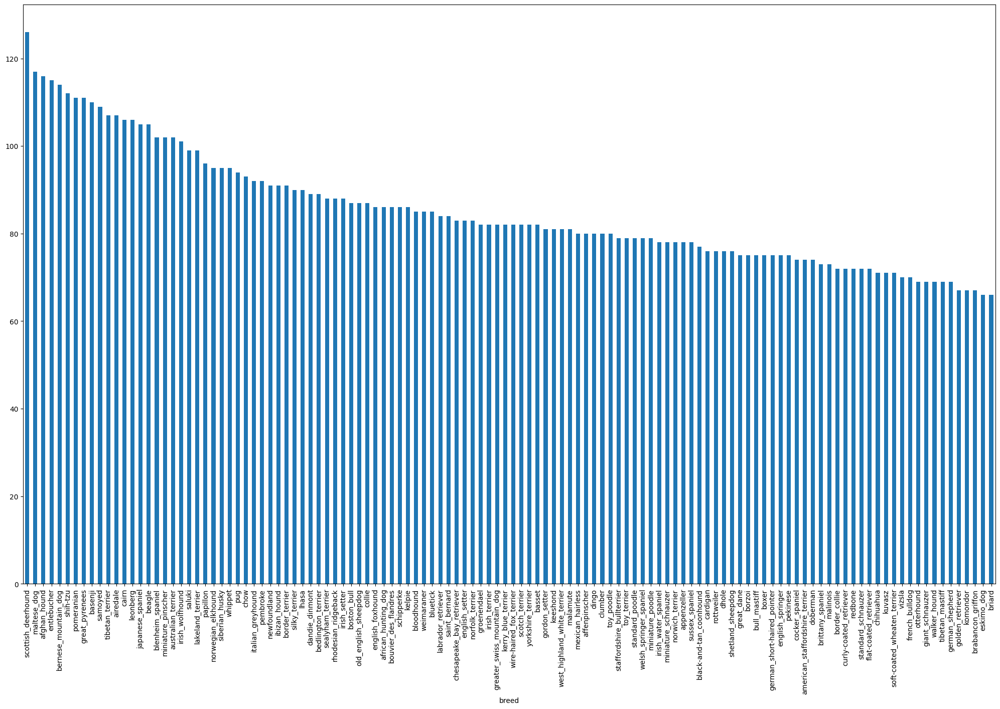

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(25,15))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

In [ ]:
labels_csv["breed"].value_counts().mean()

85.18333333333334

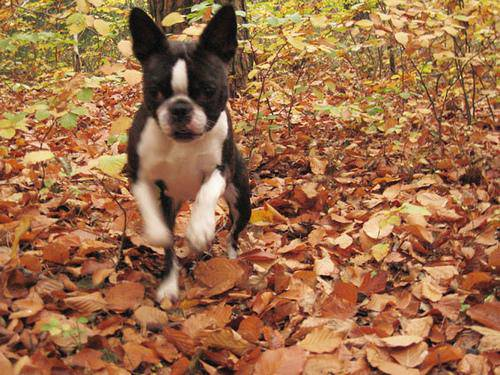

In [ ]:
from IPython.display import display,Image
Image("drive/MyDrive/Dog-Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [ ]:
filenames = ["drive/MyDrive/Dog-Vision/train/" + file + ".jpg" for file in labels_csv["id"]]
filenames[9000]

'drive/MyDrive/Dog-Vision/train/e20e32bf114141e20a1af854ca4d0ecc.jpg'

In [ ]:
import os
if len(os.listdir("drive/MyDrive/Dog-Vision/train/"))==len(filenames):
  print("Filenames match actual amount of training files()")

else:
  print("Filenames do not match actual amount of files(), check the target directory")

Filenames match actual amount of training files()


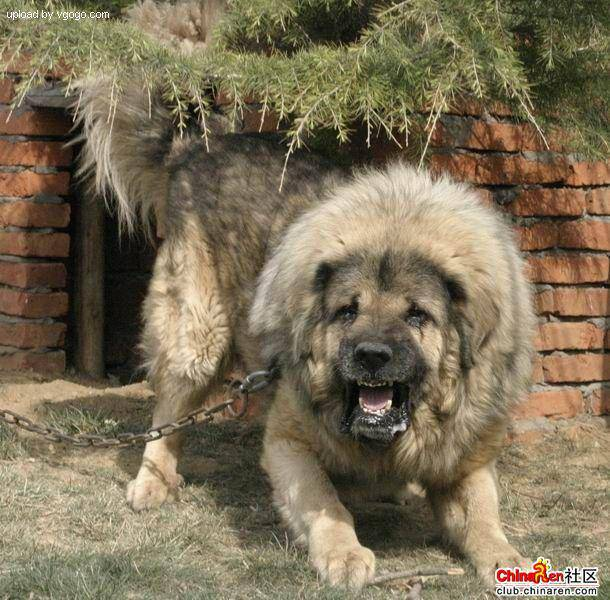

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [ ]:
labels=labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
if len(labels)==len(filenames):
  print("Number of labels matches number of files")
else:
  print("Nuber of labels does not matches number of files, check directory!!!")

Number of labels matches number of files


In [ ]:
unique_breeds=np.unique(labels)
print(type(unique_breeds))
print(unique_breeds)
print(len(unique_breeds))

<class 'numpy.ndarray'>
['affenpinscher' 'afghan_hound' 'african_hunting_dog' 'airedale'
 'american_staffordshire_terrier' 'appenzeller' 'australian_terrier'
 'basenji' 'basset' 'beagle' 'bedlington_terrier' 'bernese_mountain_dog'
 'black-and-tan_coonhound' 'blenheim_spaniel' 'bloodhound' 'bluetick'
 'border_collie' 'border_terrier' 'borzoi' 'boston_bull'
 'bouvier_des_flandres' 'boxer' 'brabancon_griffon' 'briard'
 'brittany_spaniel' 'bull_mastiff' 'cairn' 'cardigan'
 'chesapeake_bay_retriever' 'chihuahua' 'chow' 'clumber' 'cocker_spaniel'
 'collie' 'curly-coated_retriever' 'dandie_dinmont' 'dhole' 'dingo'
 'doberman' 'english_foxhound' 'english_setter' 'english_springer'
 'entlebucher' 'eskimo_dog' 'flat-coated_retriever' 'french_bulldog'
 'german_shepherd' 'german_short-haired_pointer' 'giant_schnauzer'
 'golden_retriever' 'gordon_setter' 'great_dane' 'great_pyrenees'
 'greater_swiss_mountain_dog' 'groenendael' 'ibizan_hound' 'irish_setter'
 'irish_terrier' 'irish_water_spaniel' 'ir

In [ ]:
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
boolean_labels=[bool_labels==unique_breeds for bool_labels in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
print(labels[0])
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating Validation set
As kaggle don't provide validation set we've to create it separately.

In [ ]:
X=filenames
y=boolean_labels

In [ ]:
print(len(X))
print(len(y))

10222
10222


We'll start  off experimenting from 100 images and increase if needed.

In [ ]:
NUM_IMAGES=1000 #@param{type:"slider",min:1000,max:10000,step:1000}

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],
                                               test_size=0.2,
                                               random_state=42)

In [ ]:
len(X_train),len(X_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [ ]:
X_train[:5],y_train[:2]

(['drive/MyDrive/Dog-Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog-Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog-Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog-Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog-Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing Images into tensors.
We'll make  function which will conert imaage into tensors, also we can use this function for the rest of the time.
1. Take an `image` filepath as input.
2. Use tensorflow to read the file and save it to a variable, `image`.
3.Turn our `image` into tensors.
4.Normalize the `image`(i.e. Convert conor channel values from 0-255 to 0-1).
5.Resize the `image`(224,224).
6.Return the modified `image`.

Before we do, let's see how imorting an `image` looks like.

In [ ]:
from matplotlib.pyplot import imread
image=imread(filenames[0])
image.shape

(375, 500, 3)

In [ ]:
image.max(),image.min(),

(255, 0)

array([[[108,  46,   0],
        [152,  92,  42],
        [180, 120,  70],
        ...,
        [176, 144,  69],
        [189, 157,  82],
        [214, 182, 107]],

       [[151,  93,  47],
        [179, 121,  75],
        [167, 111,  64],
        ...,
        [167, 136,  56],
        [172, 139,  60],
        [188, 157,  77]],

       [[151,  98,  56],
        [188, 137,  94],
        [162, 113,  70],
        ...,
        [200, 168,  81],
        [196, 162,  75],
        [200, 168,  81]],

       ...,

       [[189, 122,  69],
        [186, 119,  66],
        [183, 116,  63],
        ...,
        [213, 160, 106],
        [212, 159, 107],
        [209, 156, 102]],

       [[186, 119,  66],
        [184, 117,  64],
        [183, 116,  63],
        ...,
        [197, 145,  88],
        [199, 146,  92],
        [199, 147,  90]],

       [[182, 115,  62],
        [181, 114,  61],
        [183, 116,  63],
        ...,
        [184, 132,  74],
        [190, 138,  81],
        [192, 140,  82]]], dtype=uint8)
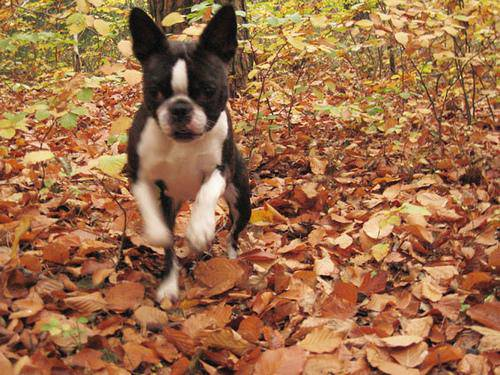

In [ ]:
image

#### Converting image into tensors.

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[108,  46,   0],
        [152,  92,  42],
        [180, 120,  70],
        ...,
        [176, 144,  69],
        [189, 157,  82],
        [214, 182, 107]],

       [[151,  93,  47],
        [179, 121,  75],
        [167, 111,  64],
        ...,
        [167, 136,  56],
        [172, 139,  60],
        [188, 157,  77]]], dtype=uint8)>

Now we've seen how image is converted into tensors, let's make a function to preprocess them all.



In [ ]:
IMG_SIZE=224
def process_image(image_path,img_size=IMG_SIZE):
  """
    Takes an image as input and convert it into tensors.
  """
  image=tf.io.read_file(image_path) # This reads the image file.
  image=tf.image.decode_jpeg(image,channels=3) # This turns the jpeg file into tensors with 3 channels.
  image=tf.image.convert_image_dtype(image,tf.float32) # This normalize the image.
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE]) #Changes the size of image and changed it into(224,224).
  return image

### Turning data into batches.

But why, beacuse at once we cannot process 10,000+ images as they might not fit into memory.

So that's why we do about 32 images at a time(usual batch size but we cn change it).

To use tensorflow effectively, we need our data in the form of Tensor tuples which looks like this
`(image,label)`.

In [ ]:
### Create a function to return a tuple(image,label).
def get_image_label(image_path,label):
  """ Takes image path and label as input and returns tuple of image and label"""
  image=process_image(image_path,label)
  return image,label


In [ ]:
get_image_label(X[42],tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we'll turn our data(i.e, X & Y) into batches

In [ ]:
BATCH_SIZE=32
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  '''
  Create batches of data out of image(x)  and label(y).
  Shuffles the data if it's training data but doesn't shuffle when valid or test data.
  Also accepts test data as input(but no labels)
  '''
  if test_data: # WE don't need labels
    print("Creating test data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepaths no labels.
    data_batch=data.map(process_image).batch(BATCH_SIZE) #We are using process image because we want test data of image only and not labels.
    return data_batch

  elif valid_data: # We don't need to shuffle if it is validation data
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))    # Turn filepaths and labels into Tensors
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating trainind data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))    # Turn filepaths and labels into Tensors
    data=data.shuffle(buffer_size=len(X))# Shuffling pathnames and labels before mapping image processor function is faster than after mapping
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch




In [ ]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating trainind data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches
As it is hard to understand to know what is happening in these batches.

In [ ]:
def show_25_images(images,labels):
  """
  Displays the  plot of  25 images with their labels.
  """
  plt.figure(figsize=(13,13))
  for i in range(25):
    ax=plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off") #removes all lables like and y also legends.


In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

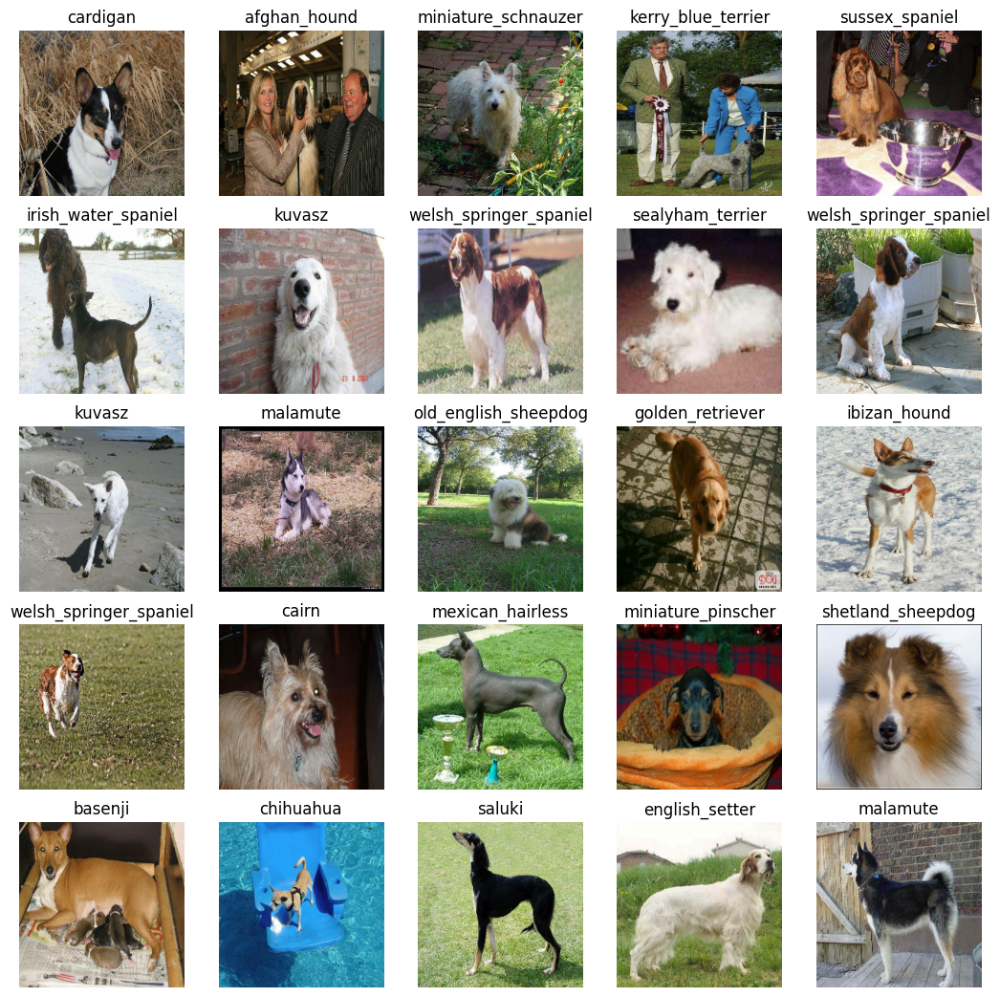

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator()) #makes tuple of train image and train label and then automatically iterates to next one
len(train_images),len(train_labels)
show_25_images(train_images,train_labels) ##Everytime we run it will give different images and labels because training data shuffels each time.

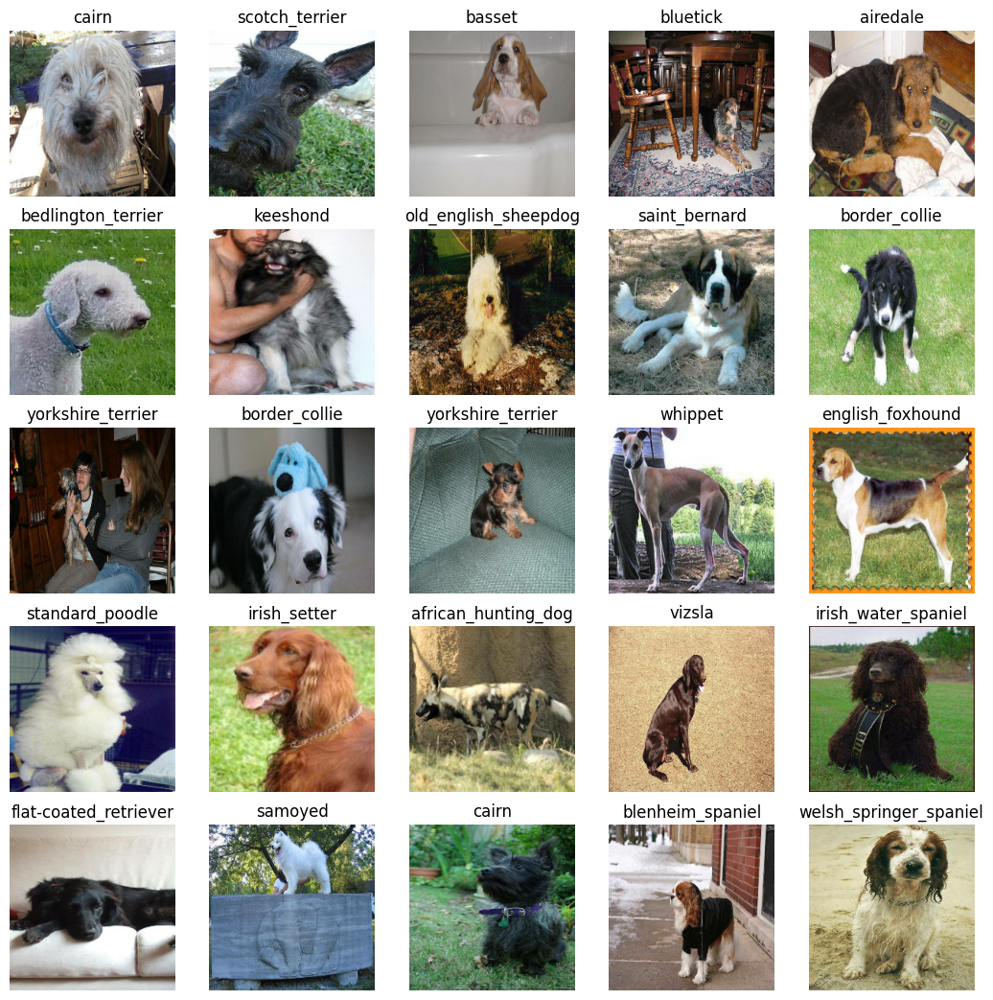

In [ ]:
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels) # It will remain same each time

## Building a model
Before ewe build a model, there are few things which we need to define:
* The input shape(our images shape, in the form of tensors) to our model.
* The output shape(image labels, in the form of Tensors)
* The url of the model we use


In [ ]:
# Setup input shape of the model
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3] #batch,height,width,color channel

#Set output shape of our model
OUTPUT_SHAPE=len(unique_breeds)

# Setup model URL from Tensorflow model
MODEL_URL="https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4"

Now our input, output and model are ready to go.
Knowing this we'll create a function which:
* takes input shape, output shape and model as a paramter.
* defines the  layers in meras model in sequential pattern.
* compiles the model(it should be evaluated and improved).
* builds the model(tells the model what input shape it will be getting).
* return the model.

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model=create_model(INPUT_SHAPE,OUTPUT_SHAPE,MODEL_URL)

Building model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              3540265   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 3660505 (13.96 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 3540265 (13.51 MB)
_________________________________________________________________


## Creating callbackss
Callbacks are functions tha helps to customize the behaviour of keras model during training, evaluating and inference. It can save, checks its progress or stop early if model's progess is decreasing.

We'll be creating two callbacks, one for Tensorboard which tracks the models progress and another one for to stop training th model if it is training for too long.

## TensorBoard Callback
 To setup TensorBoard Callback we need to do 3 things:
 1. Load the TensorBoard notebook extension.
 2. Create a TensorBoard callback which tracks models progess and saves log in the directory and can pass it to the model's `fit()` function.
 3. Visualize our model's training logs using `%tensorboard` magic function.

In [ ]:
#Load tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime
#Creates a function to create TensorBoard callback
def create_tensorboard_callback():
  # Creates a log filedirectory to store TensoBoard logs
  log_dir=os.path.join("drive/MyDrive/Dog-Vision/logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(log_dir)

## Early Stopping Callbacks
Early stopping callbacks helps stop our models from overfitting by stopping training is a certain evaluation metric stops improving.

In [ ]:
## Create Early stop callback
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=3)

## Training a model(on the subset of data)
Our first model is only going to train on 1,000 images only to ensure evrything is working finely.

In [ ]:
NUM_EPOCHS=100 #@param{type:"slider",min:10,max:100,step:10}

Let's create a function which trains a model.
* Create a model using create_model().
* Setup a TensorBoard callback using create_tensorboard_callback().
* Call the fit() function on our model passing it the training data, validation data, number of epochs to train for(NUM_EPOCHS) and the callbacks we'd use.
* Return the model.


In [ ]:
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  ## Create a model
  model=create_model()
  ## create a tensorboard session everytime we train the model
  tensorboard=create_tensorboard_callback()

  ## Fit the model to the data passing it the callbacks we created.
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  ## Return the fit
  return model


In [ ]:
model=train_model()

Building model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4
Epoch 1/100
25/25 [==============================] - 136s 3s/step - loss: 4.4720 - accuracy: 0.0875 - val_loss: 3.3495 - val_accuracy: 0.2700
Epoch 2/100
25/25 [==============================] - 4s 165ms/step - loss: 1.4927 - accuracy: 0.7150 - val_loss: 2.0473 - val_accuracy: 0.5450
Epoch 3/100
25/25 [==============================] - 4s 155ms/step - loss: 0.4971 - accuracy: 0.9450 - val_loss: 1.6115 - val_accuracy: 0.6100
Epoch 4/100
25/25 [==============================] - 5s 205ms/step - loss: 0.2227 - accuracy: 0.9937 - val_loss: 1.4592 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 4s 171ms/step - loss: 0.1314 - accuracy: 0.9975 - val_loss: 1.4106 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 4s 146ms/step - loss: 0.0905 - accuracy: 0.9987 - val_loss: 1.3688 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================] - 5s

## The issue of Overfitting
As we can see accuracy is 1 but validation_accuracy is not that great so we can suggest that model is overfittting the traning data.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog-Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating a model on the trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
predictions=model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 2s 109ms/step


array([[5.4297715e-02, 8.7300804e-04, 6.9957430e-05, ..., 8.0572740e-05,
        1.4242680e-04, 1.1601384e-03],
       [7.0014026e-04, 3.4618296e-03, 3.7249498e-02, ..., 3.1866708e-05,
        9.9789370e-03, 4.1634066e-05],
       [5.7592234e-07, 7.2995565e-05, 1.5335660e-05, ..., 1.7486720e-05,
        3.8666499e-06, 1.0931483e-04],
       ...,
       [2.6259770e-05, 2.0037855e-04, 1.5359550e-05, ..., 2.4192648e-05,
        2.5003668e-04, 1.0851816e-04],
       [2.0081968e-04, 5.9925433e-06, 4.5650690e-06, ..., 1.8511961e-05,
        3.5846868e-05, 1.8836426e-03],
       [1.2396813e-04, 1.0166157e-05, 4.8530976e-05, ..., 1.3062220e-02,
        1.4352539e-03, 2.1569487e-03]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

It is predicting what is the probability of each label(there are 120 lables and the one with highest probability will be the predicted label) for val data(200)

In [ ]:
index=8
print(predictions[index])
print(f"The predicted label is: {unique_breeds[predictions[index].argmax()]}")
print(f"The actual labels is {unique_breeds[val_labels[index].argmax()]}")
print(f"Max value of prediction is {predictions[index].max()}")

[4.43596218e-05 2.54443218e-03 3.17505182e-04 8.04437223e-05
 1.59951311e-03 1.74048837e-04 1.41709961e-03 1.61820950e-04
 7.63381599e-04 2.97568709e-04 2.27742130e-04 1.23172544e-03
 3.08925257e-04 6.41339552e-03 3.52240604e-04 3.13697637e-05
 1.37804111e-03 2.55637453e-04 3.09690571e-04 4.70234692e-04
 5.60033252e-04 4.39623324e-03 4.21820092e-04 1.01141147e-02
 7.65590323e-03 2.42117010e-02 7.08444102e-04 5.37586806e-04
 1.64410172e-04 4.72917782e-05 3.32021108e-03 1.84856716e-03
 2.11341633e-03 6.67480985e-03 4.67272184e-04 3.48496775e-04
 5.00728434e-04 3.60995269e-04 2.77743064e-04 1.03518751e-03
 3.29890521e-03 1.10566674e-03 4.17087867e-04 6.43706357e-04
 6.38077734e-03 1.70886677e-04 5.43425151e-04 1.09623303e-04
 8.55138467e-04 2.77346844e-04 7.18569034e-04 4.75014618e-04
 1.24834699e-03 1.67760421e-02 1.95586029e-03 4.64186422e-04
 6.10511051e-05 4.52391541e-05 4.93201835e-04 1.55330705e-03
 2.54093884e-05 3.05090379e-02 3.41438921e-04 3.28356749e-04
 1.62176118e-04 6.069099

Get predicted labels into their respective labels for future pupose

In [ ]:
def get_predicted_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

In [ ]:
pred_labels=get_predicted_label(predictions[42])
pred_labels

'english_foxhound'

Now our validation data is still in batch format, we'll have to unbatchify it so we can make predictions on the validation images and then compare those predictions to the validation labels(truth labels).

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
images=[]
labels=[]
for image, label in val_data.unbatch().as_numpy_iterator():
  images.append(image)
  labels.append(label)
images[0],labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_predicted_label(labels[2])

'basset'

In [ ]:
get_predicted_label(predictions[2])

'basset'

In [ ]:
def unbatchify(data):
  '''This function will take any dataset as the input and it will unbatch that dataset for then
     evaluating the model and in last it will return the images and labels in separate arrays.'''
  images=[]
  labels=[]
  for image,label in data.unbatch().as_numpy_iterator():
    labels.append(unique_breeds[np.argmax(label)])
    images.append(image)
  return images,labels

In [ ]:
val_images,val_labels=unbatchify(val_data)
val_images[1],val_labels[1]

(array([[[0.96018916, 0.97587544, 0.979797  ],
         [0.9617217 , 0.977408  , 0.98132956],
         [0.9651424 , 0.9808287 , 0.9847503 ],
         ...,
         [0.95294124, 0.9725491 , 0.9960785 ],
         [0.94906336, 0.9686712 , 0.9922006 ],
         [0.94802153, 0.9676294 , 0.9911588 ]],
 
        [[0.97587544, 0.9915617 , 0.9954833 ],
         [0.9765078 , 0.99219406, 0.9961156 ],
         [0.9802049 , 0.99589115, 0.99981266],
         ...,
         [0.96018916, 0.979797  , 1.        ],
         [0.9563113 , 0.9759191 , 0.9994114 ],
         [0.95366776, 0.9732756 , 0.99680495]],
 
        [[0.9686275 , 0.9843138 , 0.98823535],
         [0.9689829 , 0.98466915, 0.9885907 ],
         [0.972765  , 0.9884513 , 0.9923729 ],
         ...,
         [0.9677083 , 0.98731613, 1.        ],
         [0.9650211 , 0.9846289 , 1.        ],
         [0.9610995 , 0.98070735, 0.9960785 ]],
 
        ...,
 
        [[0.29487073, 0.40404442, 0.24774945],
         [0.13160652, 0.22889124, 0.11186

In [ ]:
get_predicted_label(val_labels[10]),get_predicted_label(predictions[10])

('affenpinscher', 'scottish_deerhound')

Now we've got our :
* prediction labels
* validation labels(truth values)
* validation images

Let's make a function to visualize them properly
We'll create a function which :
* takes an array of prediction probabailities, truth labels(validation labels), arary of images and integer.
* Convert the prediction probbabilitites to pedicted labels.
* Plot the predicted labels with their predicted probability, the truth label and the target image of a single plot.

In [ ]:
def plot_pred(prediction_probabilities,labels,images,n):

  pred_prob, labels,img =prediction_probabilities[n],val_labels[n],images[n]
  pred_labels=get_predicted_label(pred_prob)

  if pred_labels==labels:
    color="green"
  else:
    color="red"
  plt.imshow(img)
  plt.xticks([])
  plt.yticks([])
  plt.title(
        f"Predicted: {pred_labels} ({np.max(pred_prob) * 100:.2f}%)\n"
        f"True: {labels}",
        color=color
    )
  plt.show()

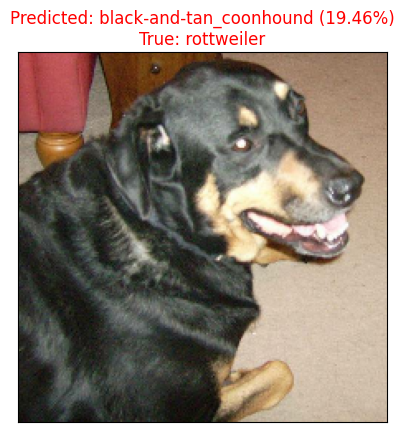

In [ ]:
  plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=122)

Now we've got function to visualize our mmodels top prediction, let's make another to view our models top 10 predictions.

This function will:
* takes an input of prediction probabilities array ad a ground truth array and an integer.
* find the top 10:
  * Prediction probbailities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  pred_prob,true_label=prediction_probabilities[n],labels[n]
  pred_label=get_predicted_label(prediction_probabilities=pred_prob)
  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]
  top_10_pred_values=pred_prob[top_10_pred_indexes]
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]

  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_pred_values)
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass


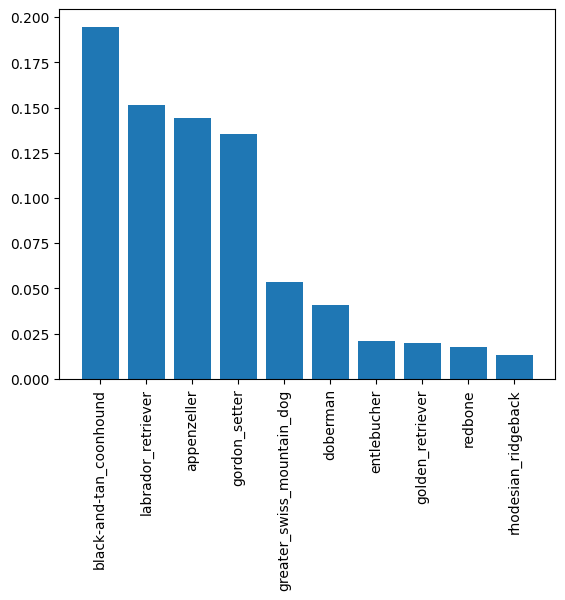

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=122)

Now we've got some functions to help us visualize our predictions and evaluate our model, lets check out.

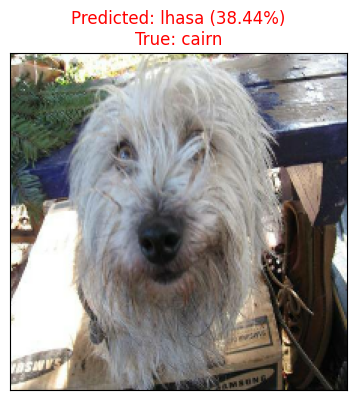

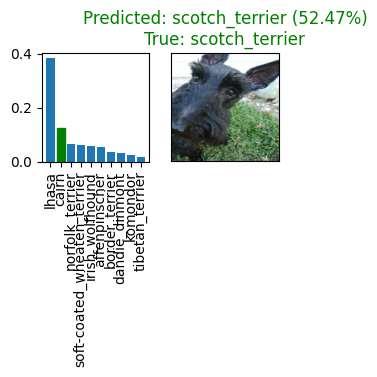

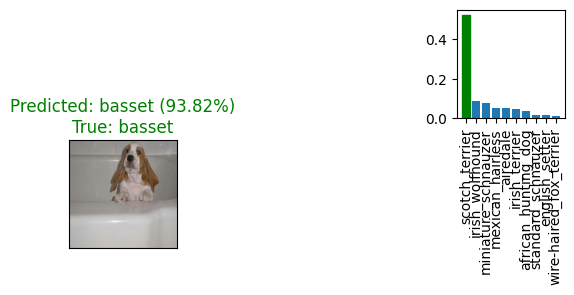

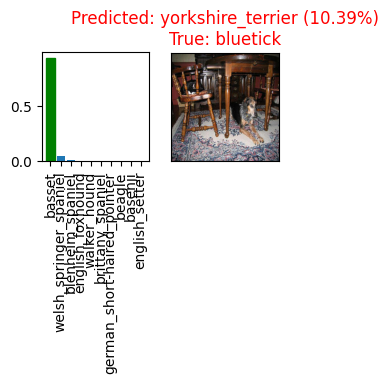

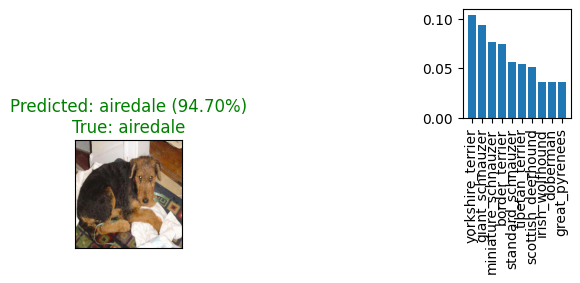

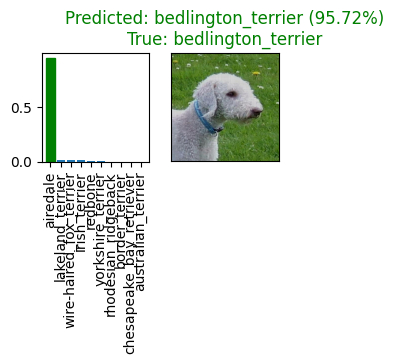

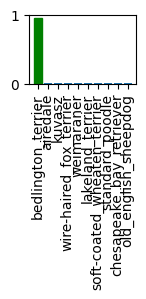

In [ ]:
i_multiplier=0
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):

  plt.subplot(num_rows,num_cols*2,2*i+1)
  plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=i+i_multiplier)

  plt.subplot(num_rows,num_cols*2,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=i+i_multiplier)

plt.tight_layout(h_pad=1.0,w_pad=2)
plt.show()

## Saving and reloading a trained model

In [ ]:
def save_model(model,suffix=None):
  '''
  Saves a given model in a models directory and appends a suffix(string)
  '''
  modeldir=os.path.join("drive/MyDrive/Dog-Vision/models",datetime.datetime.now().strftime("%Y%m%d-%H%M%S")) # Creates a model directory pathname with current time
  model_path=modeldir+"_"+suffix+".h5"
  model.save(model_path)
  print(f"Saving model to : {model_path}...")
  return model_path

In [ ]:
def load_model(model_path):
  '''
  This function loads the saved model from a specified path.
  '''
  print(f"Loading a saved model form : {model_path}")
  model=tf.keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions that saves the model and loads the model.

In [ ]:
save_model(model,suffix="1000-images-mobilenetv2-Adam")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Saving model to : drive/MyDrive/Dog-Vision/models/20241204-052051_1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog-Vision/models/20241204-052051_1000-images-mobilenetv2-Adam.h5'

In [ ]:
loaded_model=load_model("drive/MyDrive/Dog-Vision/models/20241129-200709_1000-images-mobilenetv2-Adam.h5")

Loading a saved model form : drive/MyDrive/Dog-Vision/models/20241129-200709_1000-images-mobilenetv2-Adam.h5


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 2s 198ms/step - loss: 1.2468 - accuracy: 0.6800


[1.2468276023864746, 0.6800000071525574]

In [ ]:
loaded_model.evaluate(val_data)

7/7 [==============================] - 3s 192ms/step - loss: 1.3526 - accuracy: 0.6850


[1.352568507194519, 0.6850000023841858]

In [ ]:
## Training a big dog model(on the full data)

In [ ]:
len(X),len(y)

(10222, 10222)

In [ ]:
full_data=create_data_batches(X,y)


Creating trainind data batches...


In [ ]:
full_model=create_model()

Building model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4


In [ ]:
full_model_tensorboard=create_tensorboard_callback()
full_model_early_callback=tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

Running below cell can take upto 30 mins so wait...

In [ ]:
full_model.fit(x=full_data,epochs=NUM_EPOCHS,callbacks=[full_model_tensorboard,full_model_early_callback])

Epoch 1/100
320/320 [==============================] - 48s 140ms/step - loss: 1.2750 - accuracy: 0.6847
Epoch 2/100
320/320 [==============================] - 43s 135ms/step - loss: 0.3833 - accuracy: 0.8832
Epoch 3/100
320/320 [==============================] - 43s 134ms/step - loss: 0.2194 - accuracy: 0.9385
Epoch 4/100
320/320 [==============================] - 41s 127ms/step - loss: 0.1398 - accuracy: 0.9668
Epoch 5/100
320/320 [==============================] - 42s 132ms/step - loss: 0.0960 - accuracy: 0.9809
Epoch 6/100
320/320 [==============================] - 43s 134ms/step - loss: 0.0698 - accuracy: 0.9878
Epoch 7/100
320/320 [==============================] - 41s 130ms/step - loss: 0.0527 - accuracy: 0.9926
Epoch 8/100
320/320 [==============================] - 43s 133ms/step - loss: 0.0433 - accuracy: 0.9943
Epoch 9/100
320/320 [==============================] - 43s 135ms/step - loss: 0.0338 - accuracy: 0.9964
Epoch 10/100
320/320 [==============================] - 42s 131m

In [ ]:
save_model(full_model,suffix="Full_model_Adam_optimizer")

Saving model to : drive/MyDrive/Dog-Vision/models/20241204-054146_Full_model_Adam_optimizer.h5...


'drive/MyDrive/Dog-Vision/models/20241204-054146_Full_model_Adam_optimizer.h5'

In [ ]:
loaded_full_model=load_model("drive/MyDrive/Dog-Vision/models/20241130-140736_Full_model_Adam_optimizer.h5")

Loading a saved model form : drive/MyDrive/Dog-Vision/models/20241130-140736_Full_model_Adam_optimizer.h5


## Making predictions on the test dataset
Since till now we've trained our model on tensors , therefore we've to conert this test images into tensors first.
Luckily we created `create_data_batches()` function which dircectly converts image into tensors.
To make predicitions on the test data we have to:
* get the test image filenames.
* Convert the filenames into test data batches using `creat_data_batches()` function amd setting test_data as true in the function.
* Make a predictions array by passing test data batches to the  `predict()` method called on our model.

In [ ]:
test_filename=["drive/MyDrive/Dog-Vision/test/"+ fname for fname in os.listdir("drive/MyDrive/Dog-Vision/test/")]
print(len(test_filename))
test_filename[:10]

10357


['drive/MyDrive/Dog-Vision/test/e757a7450559dc61a9261fe978e23b04.jpg',
 'drive/MyDrive/Dog-Vision/test/e293d06016cac647cd289e2008a4623a.jpg',
 'drive/MyDrive/Dog-Vision/test/e55d2fced9eb7e46aef5bdb288145fa4.jpg',
 'drive/MyDrive/Dog-Vision/test/e381c5fcf1420985b20117e4bc7d38cd.jpg',
 'drive/MyDrive/Dog-Vision/test/df577444ba8b7733f42c49e9d42111a9.jpg',
 'drive/MyDrive/Dog-Vision/test/e527455253416f809a73886b6003020d.jpg',
 'drive/MyDrive/Dog-Vision/test/e40a39dd88f04b29ab3cb3a986503f8f.jpg',
 'drive/MyDrive/Dog-Vision/test/e702ddff98bd0b05ab200ffb43fb080a.jpg',
 'drive/MyDrive/Dog-Vision/test/e4b7ff61849485992246c0f2ab7e8804.jpg',
 'drive/MyDrive/Dog-Vision/test/e7b608110b0e29120d8740f37e85f3d0.jpg']

In [ ]:
test_data=create_data_batches(test_filename,test_data=True)


Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_predictions=loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 358s 1s/step


In [ ]:
test_predictions[:10]

array([[4.5681692e-12, 1.0677282e-09, 5.0152806e-07, ..., 2.3767121e-04,
        1.9113104e-10, 1.1453506e-08],
       [1.9650826e-13, 1.4601547e-14, 8.0592119e-13, ..., 1.2068061e-14,
        4.8902202e-13, 1.6171285e-07],
       [2.7165725e-10, 2.9757793e-10, 2.3212787e-09, ..., 1.2804914e-07,
        2.4884658e-08, 2.0277559e-08],
       ...,
       [4.5957397e-05, 2.3619621e-05, 4.3015694e-07, ..., 1.9832787e-06,
        3.4237407e-06, 5.3713634e-04],
       [3.1318739e-10, 4.0731935e-11, 1.0813866e-11, ..., 2.3754643e-08,
        8.0560085e-07, 6.6794676e-09],
       [5.5470490e-08, 1.7138406e-14, 2.9052222e-10, ..., 1.0228035e-10,
        5.4335551e-13, 3.0601313e-11]], dtype=float32)

In [ ]:
np.savetxt("drive/MyDrive/Dog-Vision/preds_array.csv",test_predictions,delimiter=",")

In [ ]:
test_predictions=np.loadtxt("drive/MyDrive/Dog-Vision/preds_array.csv",delimiter=",")

In [ ]:
test_predictions[:10]


array([[4.56816919e-12, 1.06772824e-09, 5.01528064e-07, ...,
        2.37671207e-04, 1.91131042e-10, 1.14535057e-08],
       [1.96508256e-13, 1.46015470e-14, 8.05921193e-13, ...,
        1.20680613e-14, 4.89022017e-13, 1.61712848e-07],
       [2.71657252e-10, 2.97577935e-10, 2.32127872e-09, ...,
        1.28049138e-07, 2.48846579e-08, 2.02775592e-08],
       ...,
       [4.59573967e-05, 2.36196211e-05, 4.30156945e-07, ...,
        1.98327871e-06, 3.42374074e-06, 5.37136337e-04],
       [3.13187393e-10, 4.07319352e-11, 1.08138663e-11, ...,
        2.37546427e-08, 8.05600848e-07, 6.67946765e-09],
       [5.54704904e-08, 1.71384056e-14, 2.90522217e-10, ...,
        1.02280351e-10, 5.43355508e-13, 3.06013132e-11]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle
Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed. ✅
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_ids=[os.path.splitext(path)[0] for path in os.listdir("drive/MyDrive/Dog-Vision/test/")]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e757a7450559dc61a9261fe978e23b04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e293d06016cac647cd289e2008a4623a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e55d2fced9eb7e46aef5bdb288145fa4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e381c5fcf1420985b20117e4bc7d38cd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,df577444ba8b7733f42c49e9d42111a9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e757a7450559dc61a9261fe978e23b04,4.568169e-12,1.067728e-09,5.015281e-07,7.876220e-11,2.379868e-09,2.247315e-10,2.696214e-09,6.553225e-10,6.007424e-09,...,2.128902e-09,1.431694e-09,1.241195e-07,4.371027e-11,2.108304e-10,1.725300e-09,1.032147e-09,2.376712e-04,1.911310e-10,1.145351e-08
1,e293d06016cac647cd289e2008a4623a,1.965083e-13,1.460155e-14,8.059212e-13,1.465938e-12,1.265040e-14,1.454271e-14,5.305043e-10,3.989032e-15,8.856674e-15,...,2.167901e-12,9.282291e-13,3.279269e-14,3.973316e-14,2.196027e-14,7.406499e-14,8.393883e-13,1.206806e-14,4.890220e-13,1.617128e-07
2,e55d2fced9eb7e46aef5bdb288145fa4,2.716573e-10,2.975779e-10,2.321279e-09,5.784190e-08,1.633734e-09,5.573992e-06,3.011128e-09,2.369005e-08,1.413587e-11,...,9.183493e-10,1.693245e-08,1.270518e-07,5.420163e-08,1.476136e-09,4.934091e-11,5.673952e-10,1.280491e-07,2.488466e-08,2.027756e-08
3,e381c5fcf1420985b20117e4bc7d38cd,3.866335e-10,7.420293e-07,3.243684e-09,1.086380e-06,2.928485e-09,3.337215e-05,9.770246e-10,4.295267e-08,4.050908e-08,...,4.043343e-08,5.647061e-10,6.599959e-05,6.272055e-07,3.884103e-07,4.878696e-06,1.859471e-09,1.389987e-05,2.851217e-09,4.914431e-09
4,df577444ba8b7733f42c49e9d42111a9,3.271620e-08,2.817600e-10,3.617292e-09,4.629569e-10,6.612233e-12,1.928906e-09,1.321689e-10,6.854007e-11,3.789618e-09,...,8.693486e-09,4.448698e-10,4.771228e-10,4.859823e-10,1.697981e-11,8.595703e-11,2.707859e-12,1.749262e-09,7.298603e-10,9.496134e-08


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog-Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on custom images
To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog-Vision/My-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog-Vision/My-dog-photos/rottweiler.jpg',
 'drive/MyDrive/Dog-Vision/My-dog-photos/german shepherd.jpg',
 'drive/MyDrive/Dog-Vision/My-dog-photos/husky.jpg']

In [ ]:
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
custom_pred_labels = [get_predicted_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['rottweiler', 'german_shepherd', 'samoyed']

In [ ]:
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

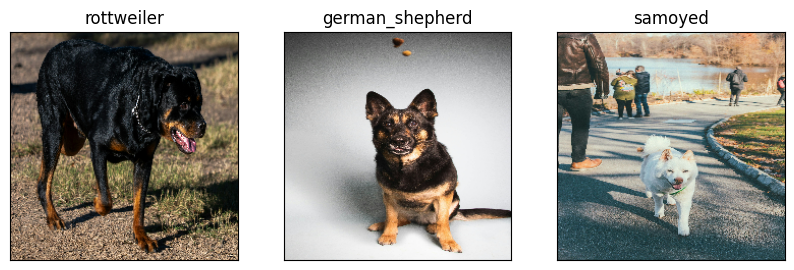

In [ ]:
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)